# Introduction

For my final capstone, I will create a model that processes a piece of an scan of breast tissue and classifies whether or not the image contains cancerous tissue. Breast cancer is the most common form of cancer in women, contributing just over a quarter of diagnoses. The images I'm looking at are scans of Invasive Ductal Carcinoma (IDC), which is the most common subtype of breast cancer at 80%, so having the ability to improve the timeline and accuracy of a diagnosis would greatly improve the handling of the disease. 

My solution will be valuable because it will capture this information more quickly and accurately than an individual could. It would be a model used by hospitals and other healthcare organizations to identify the presence of cancerous tissue. This model would be able to see abnormalities at a much earlier stage which would allow treatment to commence earlier and lead to a higher success rate.  Ideally, the model could be adjusted for other types of tumor or disease classifications.

I will use the [Breast Histopathology Images dataset](https://www.kaggle.com/paultimothymooney/breast-histopathology-images) from the National Library of Medicine. There are 277,524 pieces of 162 images scanned which should be plenty of data to learn from. The data is imbalanced - there is a 34/66 split between the classes. To handle this, I will likely choose a random subset of the images marked IDC negative to ensure I have a balanced dataset.

Because the data is images, I don't believe it doesn't to be cleaned and prepped - it will simply be imported into Python and converted into a numpy array in which each column represents a pixel. I will then use dimensionality reduction to obtain in-depth knowledge about the information the data provides and visualize any patterns or clusters the information may fall into. I will need to do some research on how to use supervised learning on image processing/classification as it is not yet clear to me how to do so. Finally, I will use neural networks, and CNN in particular, to classify the scans and create a model that can take an un-labeled scan and report whether or not cancerous tissue is present. 

I anticipate importing and processing the images as well as tuning the parameters in the neural networks to be the biggest challenges I'll face, and plan on spending the majority of my time on these two items. For the most part, I should be able to recycle code from previous projects which should expedite my prepping and modeling. I'll do additional research on how best to use neural networks for image classification in an effort to obtain the best model.


In [1]:
import os
os.chdir('C:\\Users\\M246047\\Documents\\Python')
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from datetime import datetime, timedelta
import re


# Importing/showing the files
from zipfile import ZipFile
import cv2
from glob import glob
from random import sample
import skimage.io as io

# Preprocessing/Cleaning Libraries
import xgboost
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
import scipy.stats as stats

# Import various componenets for model building
import tensorflow as tf
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import regularizers
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers import LSTM, Input, TimeDistributed
from keras.models import Model
from keras.optimizers import RMSprop
from keras.callbacks import History

# Dimensionality Reduction & Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.manifold import LocallyLinearEmbedding, TSNE
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
import hdbscan
from sklearn import datasets, metrics
from sklearn.neural_network import BernoulliRBM
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage as lnkg
from sklearn.neural_network import MLPClassifier


# Import the backend
from keras import backend as K
from keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization
from keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from keras.callbacks import EarlyStopping, ModelCheckpoint
# Data Augmentation
import argparse



# Set random seed
np.random.seed(0)

Using TensorFlow backend.


# The Images

Below we see samples of cancerous and non-cancerous tissue. The images containing cancer generally appear to be darker and more densely packed, a distinction that a model may use to classify an image. 

In [170]:
non_cancerous_images = io.imread_collection('88*_class0.png')
print(type(non_cancerous_images))
print(non_cancerous_images)
io.imshow_collection(non_cancerous_images)

<class 'skimage.io.collection.ImageCollection'>
['8863_idx5_x151_y1401_class0.png', '8864_idx5_x101_y2251_class0.png', '8865_idx5_x301_y1151_class0.png', '8867_idx5_x151_y201_class0.png']


In [173]:
io.imshow_collection(8863_idx5_x151_y1401_class0.png)

SyntaxError: invalid token (<ipython-input-173-2371df216782>, line 1)

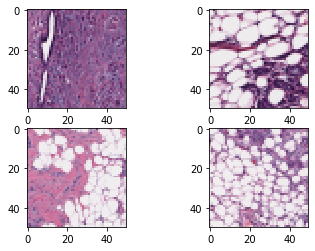

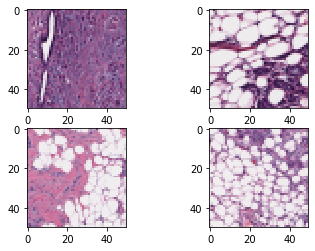

In [163]:
cancerous_images = io.imread_collection('88*_class1.png')
io.imshow_collection(cancerous_images)

# Importing and Prepping the Data

I gravely underestimated how difficult this task would be. The images came in an primary folder which contained a folder for each patient. Each of these folders contained two folders labeled 0 and 1 which contained images with or without cancerous tissue, depending on the folder. I initially attempted to iterate through each patient folder to grab the 0 and 1 folders within, and iterate through each of those folder to grab each image to import it, but was unable to do so. In the end I mapped to the primary folder and iterated through each patient folder to create arrays containing the pixel data for each image. Using the length of these arrays, I was able to create an array with the target values, with 0 for a scan without cancerous tissue and 1 for a scan with.

While I have quite a bit of data to work with, as I mentioned previously it is very imbalanced in favor of tissue without cancer - in order to combat this, I took an equal number samples of the scans without signs of cancer as scans with cancer to have an even split once the scans were imported.

In [6]:
list_of_dicts = []
for patient in glob('C:\\Users\\M246047\\Documents\\Python\\breast-histopathology-images\\*'):
    no_cancer = len([x for x in glob(patient + '\\0\\*')])
    cancer = len([x for x in glob(patient + '\\1\\*')])
    list_of_dicts.append({'patient': patient, 'cancer': cancer, 'no_cancer': no_cancer})
df = pd.DataFrame.from_dict(list_of_dicts)

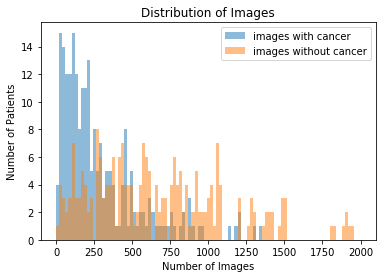

In [3]:
images_with = df['cancer']
images_without = df['no_cancer']
bins = np.linspace(0, 2000, 100)
plt.hist(images_with, bins, alpha=0.5, label='images with cancer')
plt.hist(images_without, bins, alpha=0.5, label='images without cancer')
plt.legend(loc='upper right')
plt.title('Distribution of Images')
plt.xlabel('Number of Images')
plt.ylabel('Number of Patients')
plt.show()


# Individual Patients - Importing the Images by Folder

Because there was so much data, I chose to focus on three patients and used a fourth as the validation set when first creating my models so as to expedite the process. 

In [144]:
images_0_8863 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8863\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8863\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            images_0_8863.append(image_data)
            
images_0_8863 = np.asarray(images_0_8863)    
print('There are {} images'.format(len(images_0_8863)))
print('The type of the data is', type(images_0_8863))
print('The shape of the data is', images_0_8863.shape)
images_0_8863_class = np.zeros((len(images_0_8863),), dtype=int)

There are 768 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (768, 50, 50)


In [146]:
# Creating a list of image names
images_1_8863 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8863\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8863\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8863.append(image_data)
            
images_1_8863 = np.asarray(images_1_8863)
print('There are {} images'.format(len(images_1_8863)))
print('The type of the data is', type(images_1_8863))
print('The shape of the data is', images_1_8863.shape)
images_1_8863_class = np.ones((len(images_1_8863),), dtype=int)

There are 207 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (207, 50, 50)


In [147]:
images_0_8864 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8864\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8864\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8864.append(image_data)
            
images_0_8864 = np.asarray(images_0_8864)    
print('There are {} images'.format(len(images_0_8864)))
print('The type of the data is', type(images_0_8864))
print('The shape of the data is', images_0_8864.shape)
images_0_8864_class = np.zeros((len(images_0_8864)), dtype=int)

There are 730 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (730, 50, 50)


In [148]:
# Creating a list of image names
images_1_8864 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8864\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8864\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8864.append(image_data)
            
images_1_8864 = np.asarray(images_1_8864)
print('There are {} images'.format(len(images_1_8864)))
print('The type of the data is', type(images_1_8864))
print('The shape of the data is', images_1_8864.shape)
images_1_8864_class = np.ones((len(images_1_8864),), dtype=int)

There are 326 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (326, 50, 50)


In [149]:
images_0_8865 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8865\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8865\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8865.append(image_data)
            
images_0_8865 = np.asarray(images_0_8865)    
print('There are {} images'.format(len(images_0_8865)))
print('The type of the data is', type(images_0_8865))
print('The shape of the data is', images_0_8865.shape)
images_0_8865_class = np.zeros((len(images_0_8865)), dtype=int)

There are 657 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (657, 50, 50)


In [150]:
# Creating a list of image names
images_1_8865 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8865\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8865\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8865.append(image_data)
            
images_1_8865 = np.asarray(images_1_8865)
print('There are {} images'.format(len(images_1_8865)))
print('The type of the data is', type(images_1_8865))
print('The shape of the data is', images_1_8865.shape)
images_1_8865_class = np.ones((len(images_1_8865),), dtype=int)

There are 55 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (55, 50, 50)


In [151]:
images_0_8867 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8867\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8867\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8867.append(image_data)
            
images_0_8867 = np.asarray(images_0_8867)    
print('There are {} images'.format(len(images_0_8867)))
print('The type of the data is', type(images_0_8867))
print('The shape of the data is', images_0_8867.shape)
images_0_8867_class = np.zeros((len(images_0_8867)), dtype=int)

There are 1478 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (1478, 50, 50)


In [152]:
# Creating a list of image names
images_1_8867 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8867\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8867\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8867.append(image_data)
            
images_1_8867 = np.asarray(images_1_8867)
print('There are {} images'.format(len(images_1_8867)))
print('The type of the data is', type(images_1_8867))
print('The shape of the data is', images_1_8867.shape)
images_1_8867_class = np.ones((len(images_1_8867),), dtype=int)

There are 162 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (162, 50, 50)


## Defining Training & Testing Sets and Normalizing the Data

Here I combine the non-cancerous images and target arrays with the cancerous data for a complete dataset.

## Three Training Patients

In [153]:
# Create x_train and y_train

x3_train = np.concatenate((images_0_8863, images_1_8863, images_0_8864, images_1_8864, images_0_8865, images_1_8865), axis=0)
y3_train = np.concatenate((images_0_8863_class, images_1_8863_class, images_0_8864_class, images_1_8864_class, images_0_8865_class, images_1_8865_class), axis=0)
print('x3_train shape:',x3_train.shape)
print('y3_train shape:',y3_train.shape)

# Create x_test and y_test
x3_test = np.append(images_0_8867, images_1_8867, axis=0)
y3_test = np.append(images_0_8867_class, images_1_8867_class, axis=0)

print('x3_test shape:', x3_test.shape)
print('y3_test shape: ', y3_test.shape)

x3_train shape: (2743, 50, 50)
y3_train shape: (2743,)
x3_test shape: (1640, 50, 50)
y3_test shape:  (1640,)


In [154]:
# Convert to float32 for type consistency
x3_train = x3_train.astype('float32')
x3_test = x3_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x3_train /= 255
x3_test /= 255

# Convert class vectors to binary class matrices
# So instead of one column with two values, create two binary columns
y3_train = keras.utils.to_categorical(y3_train, 2)
y3_test = keras.utils.to_categorical(y3_test, 2)

print(x3_train.shape)
print(y3_train.shape)
print(x3_test.shape)
print(y3_test.shape)

(2743, 50, 50)
(2743, 2)
(1640, 50, 50)
(1640, 2)


In [156]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x3_train = x3_train.reshape(x3_train.shape[0], 1, img_rows, img_cols)
    x3_test = x3_test.reshape(x3_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x3_train = x3_train.reshape(x3_train.shape[0], img_rows, img_cols, 1)
    x3_test = x3_test.reshape(x3_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

### CNN Model with Relu

The test metrics have slightly decreased in performance to a loss of 21.44 and accuracy of 0.90. 

In [157]:
# Building the Model
num_classes = 2
patients_3 = Sequential()
# First convolutional layer, note the specification of shape
patients_3.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
patients_3.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))

patients_3.add(Dropout(0.5))
patients_3.add(Flatten())
patients_3.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


patients_3.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

patients_3.fit(x3_train, y3_train,
          batch_size=200,
          epochs=5,
          verbose=1,
          validation_data=(x3_test, y3_test))
score = patients_3.evaluate(x3_test, y3_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 2743 samples, validate on 1640 samples
Epoch 1/5
2743/2743 [==============================] - 50s 18ms/step - loss: 570.2573 - accuracy: 0.7346 - val_loss: 354.9062 - val_accuracy: 0.9287
Epoch 2/5
2743/2743 [==============================] - 24s 9ms/step - loss: 224.1912 - accuracy: 0.8119 - val_loss: 98.8519 - val_accuracy: 0.9415
Epoch 3/5
2743/2743 [==============================] - 24s 9ms/step - loss: 47.8500 - accuracy: 0.8071 - val_loss: 19.9908 - val_accuracy: 0.9012
Epoch 4/5
2743/2743 [==============================] - 24s 9ms/step - loss: 19.9506 - accuracy: 0.7561 - val_loss: 20.1399 - val_accuracy: 0.9012
Epoch 5/5
2743/2743 [==============================] - 25s 9ms/step - loss: 20.1553 - accuracy: 0.7856 - val_loss: 20.2490 - val_accuracy: 0.9012
Test loss: 20.248972432206315
Test accuracy: 0.9012194871902466


### Plotting the Loss and Accuracy


In [25]:
print(patients_3.history.history['val_accuracy'])
print((patients_3.history.history['accuracy']))

[0.9012194871902466, 0.9012194871902466, 0.09878049045801163, 0.9012194871902466, 0.9012194871902466]
[0.72110826, 0.79584396, 0.8034998, 0.70761937, 0.7856362]


dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


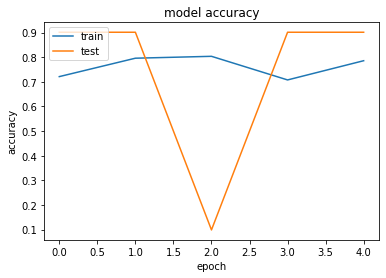

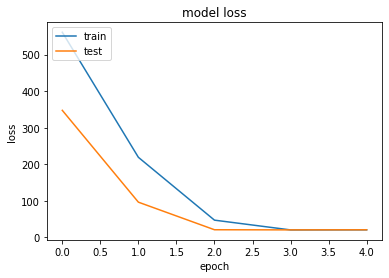

In [24]:
print(patients_3.history.history.keys())
# summarize history for accuracy
plt.plot(patients_3.history.history['accuracy'])
plt.plot(patients_3.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(patients_3.history.history['loss'])
plt.plot(patients_3.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Confusion Matrix

While the accuracy for these models has been high at around 0.9, it's clear from the confusion matrix below that the model has simply been assigning each image with a label of zero, indicating there's no cancer present. Because the data was so imbalanced, according to the accuracy this is a good model, but it's realistically terrible because it's telling us that there are no traces of cancer in any of the images. 

This is the absolute worst-case scenario because the model fails to diagnose any images containing cancerous tissue.

In [158]:
patients_3_predictions = patients_3.predict(x_test)
y_pred = (patients_3_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
matrix

array([[11695,     0],
       [11695,     0]], dtype=int64)

# Half the Data

Unfortunately, the previous models were utterly useless. Hopefully importing much more data and sampling the images without cancer to be equal in number to the images with cancer to combat the disproportion of the data will provide a better outcome. I will use approximately half the data in an effort to find a balance between the amount of data and time it takes to run the models.

## Creating the Training and Testing Data

In [85]:
X_1 = [] # training data labeled 1
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_1.append(image_data)
            
X_1 = np.asarray(X_1)    
print('There are {} images'.format(len(X_1)))
print('The type of the data is', type(X_1))
print('The shape of the data is', X_1.shape)
X_1_target = np.ones((len(X_1),), dtype=int)
X_0_target = np.zeros((len(X_1),), dtype=int)


There are 27671 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (27671, 50, 50)


In [86]:
X_0 = [] # training data labeled 0
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_0.append(image_data)
            
X_0 = np.asarray(X_0)
print('There are {} images'.format(len(X_0)))
print('The type of the data is', type(X_0))
print('The shape of the data is', X_0.shape)
X_0 = X_0[:(len(X_1)),:,:]
print('There are {} images of non-cancerous tissue once sampled'.format(len(X_0)))

There are 79600 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (79600, 50, 50)
There are 27671 images of non-cancerous tissue once sampled


In [87]:
X_1_test = [] # testing data labeled 1
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\1_test'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\1_test\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_1_test.append(image_data)
            
X_1_test = np.asarray(X_1_test)    
print('There are {} images'.format(len(X_1_test)))
print('The type of the data is', type(X_1_test))
print('The shape of the data is', X_1_test.shape)
X_1_test_target = np.ones((len(X_1_test),), dtype=int)
X_0_test_target = np.zeros((len(X_1_test),), dtype=int)

There are 11695 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (11695, 50, 50)


In [88]:
X_0_test = [] # testing data labeled 0
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\0_test'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\0_test\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_0_test.append(image_data)
            
X_0_test = np.asarray(X_0_test)    
print('There are {} images'.format(len(X_0_test)))
print('The type of the data is', type(X_0_test))
print('The shape of the data is', X_0_test.shape)
X_0_test = X_0_test[:(len(X_1_test)),:,:]
print('There are {} images of non-cancerous tissue once sampled'.format(len(X_0_test)))

There are 23173 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (23173, 50, 50)
There are 11695 images of non-cancerous tissue once sampled


# Visualizing the Data with Dimensionality Reduction

## PCA

t-SNE and UMAP are more modern techniques that typically work well with images and provide more insight than PCA. While I originally had more difficuly utilizing t-SNE and UMAP as kept crashing the kernel and took a remarkably long time to run on my machine, I had much more success once I applied PCA and used the first fifty components with these techniques. Althought PCA doesn't offer too much insight, but I can see that slides with cancerous tissue are clustering on the right side of the image.

In [89]:
X = np.concatenate((X_0, X_1, X_0_test, X_1_test), axis=0)
y = np.concatenate((X_0_target, X_1_target, X_0_test_target, X_1_test_target), axis=0)
X = X.reshape(78732,2500)
X = pd.DataFrame(X)
X = X/255
X['y'] = y
print(X.shape, y.shape)

# Because the data is so large, we may need to use a random sample for some techniques
X_sample = X.sample(frac=0.25, random_state=1)

(78732, 2501) (78732,)


In [90]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

# Plotting the visualization
plt.figure(figsize=(10,5))
colours = ["r","b"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
# plt.axis('off')
plt.show()

## t-SNE

Using the first 50 components provided by PCA greatly improved t-SNE. While the visualization below is by no means perfectly clustered, it is apparent that there's some separation between images without cancerous tissue and images with. 

In [11]:
pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(X)
print('Cumulative explained variation for 50 principal components: {}'.format(np.sum(pca_50.explained_variance_ratio_)))

Cumulative explained variation for 50 principal components: 0.7114251144447016


t-SNE with perplexity  10


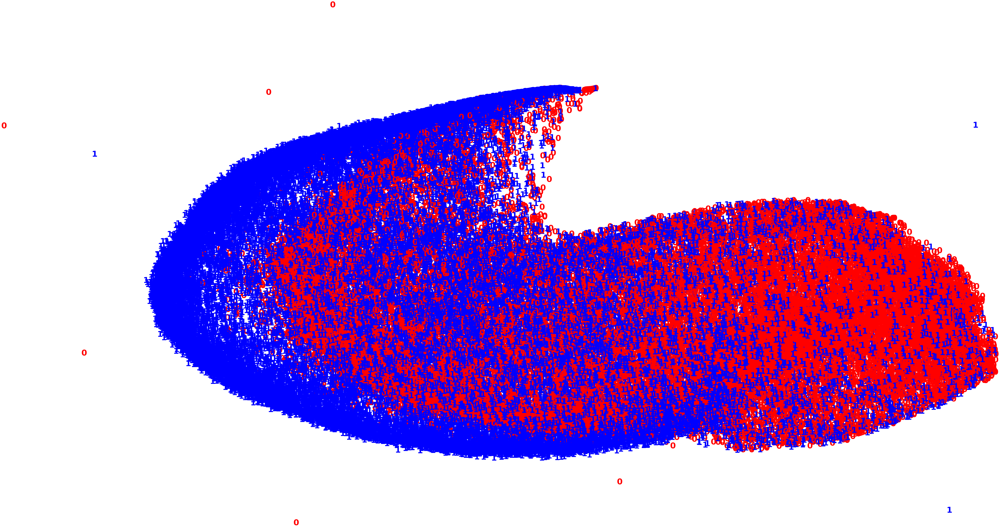

In [160]:
print('t-SNE with perplexity ', 10)
tsne = TSNE(n_components=2, verbose=0, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(pca_result_50)

plt.figure(figsize=(10,5))
colours = ["r","b"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
        color=colours[int(y[i])],
        fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## UMAP

As expected, UMAP provides the most separation for this data with a smaller minimum distance clustering the images entirely. However, it's clear that the images aren't clustered based solely on whether or not they contain cancerous tissue as there's plenty of overlap between both clusters. 

UMAP Visualization. 



C:\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\ProgramData\Anaconda3\li

UMAP for X with  500 neighbors and  0.1 minimum distance.


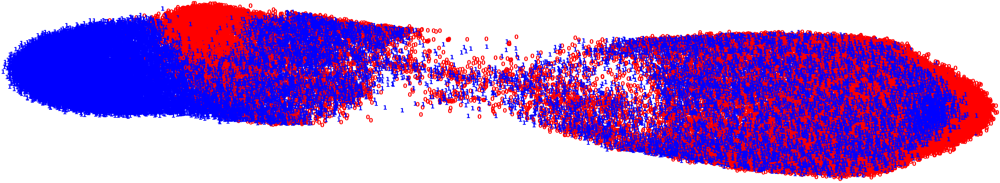

C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP for X with  500 neighbors and  0.05 minimum distance.


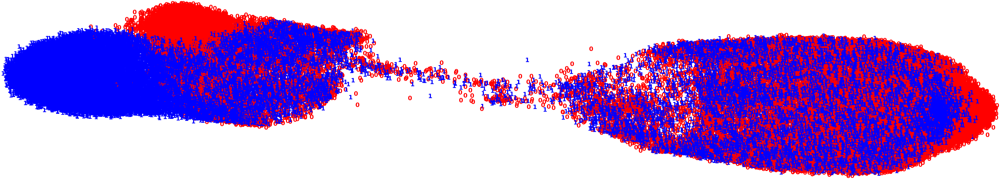

In [12]:
# UMAP with all features
print('UMAP Visualization. \n')
for n_neighbors in [500]:
    for min_dist in [0.1, 0.05]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(pca_result_50)
        print('UMAP for X with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        colours = ["r","b"]
#         plt.scatter(umap_results[:, 0], umap_results[:, 1])
        for i in range(umap_results.shape[0]):
            plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')
        

## Defining Training & Testing Sets and Normalizing the Data

In [93]:
# Create x_train and y_train
x_train = np.append(X_1, X_0, axis=0)
y_train = np.append(X_1_target, X_0_target, axis=0)
print('x_train shape:',x_train.shape)
print('y_train shape:',y_train.shape)

# Create x_test and y_test
x_test = np.append(X_1_test, X_0_test, axis=0)
y_test = np.append(X_1_test_target, X_0_test_target, axis=0)

print('x_test shape:', x_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape: (55342, 50, 50)
y_train shape: (55342,)
x_test shape: (23390, 50, 50)
y_test shape:  (23390,)


In [94]:
# Convert to float32 for type consistency
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)
# Convert class vectors to binary class matrices
# So instead of one column with 10 values, create 10 binary columns
y_train = keras.utils.to_categorical(y_train, 2)
y_test = keras.utils.to_categorical(y_test, 2)

x_train shape: (55342, 50, 50)
x_test shape: (23390, 50, 50)
y_train shape: (55342,)
y_test shape: (23390,)


In [95]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

# Supervised Learning Methods

I'll use a couple supervised learning models as starting points. Originally I wanted to test SVM on the data, but unfortunately the model took too long to run (12+ hours) which did not give me the time to tune and adjust it as I would like. Instead, I'll compare XGBoost and K-Nearest Neighbor.

## Using XGBoost as a Starting Point

This model is clearly overfitting quite a bit, with a score of 0.93 for the training sets and 0.61 for the testing set. While it is obviously not optimal, it's actually best at classifying cancerous tissue. Having a higher degree of sensitivity is ideal in this situation as incorrectly classifying non-cancerous tissue as cancerous is a much less egregious error.

In [46]:
x_train_sup = x_train.reshape(55342, 2500)
x_test_sup = x_test.reshape(23390, 2500)
y_train_sup = np.append(X_1_target, X_0_target, axis=0)
y_test_sup = np.append(X_1_test_target, X_0_test_target, axis=0)
print('X train shape: ', x_train_sup.shape)
print('Y train shape: ', y_train_sup.shape)
# print('X train unique values: ', np.unique(x_train_sup))
print('Y train unique values: ', np.unique(y_train_sup))
print(np.unique(y_test_sup))

X train shape:  (55342, 2500)
Y train shape:  (55342,)
Y train unique values:  [0 1]
[0 1]


In [47]:
# defining the model
xgb_clf = xgboost.XGBClassifier()
xgb_clf = xgb_clf.fit(x_train_sup, y_train_sup)

print('Training score:', xgb_clf.score(x_train_sup, y_train_sup))
print('Testing score:', xgb_clf.score(x_test_sup, y_test_sup))

Training score: 0.9287882620794333
Testing score: 0.6091492090637024


In [48]:
xgb_clf_predictions = xgb_clf.predict(x_test_sup)
y_pred = (xgb_clf_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test_sup, xgb_clf_predictions)
matrix

array([[6534, 5161],
       [3981, 7714]], dtype=int64)

|| Non-Cancerous Predicted | Cancerous Predicted   |
|------|------|------|
Non-Cancerous| 6,534 | 5,161 |       
Cancerous | 3,981 | 7,714 |   

<br>

|| Non-Cancerous Predicted | Cancerous Predicted   |
|------|------|------|
Non-Cancerous | 55.87% (True Negative)| 44.13% (False Positive) |
Cancerous | 34.04% (False Negative) | 65.96% (True Positive)|


## K-Nearest Neighbor

While this model outperforms XGBoost in specificity, it severely lacks in sensitivity. XGBoost is clearly the better model.

In [51]:
from sklearn.neighbors import KNeighborsClassifier
neighbors = KNeighborsClassifier(n_neighbors=10)
knn_clf = neighbors.fit(x_train_sup, y_train_sup)

print('Training score:', knn_clf.score(x_train_sup, y_train_sup))
print('Testing score:', knn_clf.score(x_test_sup, y_test_sup))
knn_clf_predictions = knn_clf.predict(x_test_sup)
matrix = metrics.confusion_matrix(y_test_sup, knn_clf_predictions)
matrix

Training score: 0.6781106573669184
Testing score: 0.5371098760153912


array([[7330, 4365],
       [6462, 5233]], dtype=int64)

|| Non-Cancerous Predicted | Cancerous Predicted   |
|------|------|------|
Non-Cancerous | 7,330 | 4,365 |       
Cancerous | 6,462 | 5,233 | 

<br>


|| Non-Cancerous Predicted | Cancerous Predicted   |
|------|------|------|
Non-Cancerous | 62.68% (True Negative)| 37.32% (False Positive) |
Cancerous | 55.25% (False Negative) | 44.75% (True Positive)|

# Creating the Neural Networks

I used sequential, CNN, and HRNN models and modified the the batch size, number of epochs, layer types, and activation functions to come up with the beswt models. Interestingly enough, the Sequential and Convolutional Neural  Networks were unable to learn to model the data - as can be seen by the confusion matrices, each is simply assigning the non-cancerous label to all images, which is our worst-case scenario. However, the Hierarchical Recurrent Neural Network was the best performing of the three and was actually able to correctly label a portion of images containing cancerous tissue.


## Model 1: Simple Sequential



In [162]:
# Start with a simple sequential model
model_seq = Sequential()
model_seq.add(Flatten())
# Add dense layers to create a fully connected MLP
# Note that we specify an input shape for the first layer, but only the first layer.
# Relu is the activation function used
model_seq.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# Dropout layers remove features and fight overfitting
model_seq.add(Dropout(0.5))
model_seq.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
model_seq.add(Dropout(0.5))
# End with a number of units equal to the number of classes we have for our outcome
model_seq.add(Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.75)))



# Compile the model to put it all together.
model_seq.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history = model_seq.fit(x_train, y_train,
                    batch_size=500,
                    epochs=5,
                    verbose=1,
                    validation_data=(x_test, y_test))
score = model_seq.evaluate(x_test, y_test, verbose=0)
# model_seq.summary()
print('Test loss:', score[0])
print('Test accuracy:', score[1])

model_seq_predictions = model_seq.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_seq_predictions.argmax(axis=1))
matrix

Train on 55342 samples, validate on 23390 samples
Epoch 1/5
55342/55342 [==============================] - 3s 48us/step - loss: 520.5439 - accuracy: 0.4673 - val_loss: 133.2231 - val_accuracy: 0.5000
Epoch 2/5
55342/55342 [==============================] - 2s 43us/step - loss: 84.0264 - accuracy: 0.5128 - val_loss: 62.6913 - val_accuracy: 0.5000
Epoch 3/5
55342/55342 [==============================] - 2s 43us/step - loss: 62.0795 - accuracy: 0.4962 - val_loss: 61.6607 - val_accuracy: 0.5000
Epoch 4/5
55342/55342 [==============================] - 2s 43us/step - loss: 61.8732 - accuracy: 0.4960 - val_loss: 62.0213 - val_accuracy: 0.5000
Epoch 5/5
55342/55342 [==============================] - 2s 44us/step - loss: 61.8939 - accuracy: 0.4986 - val_loss: 61.8108 - val_accuracy: 0.5000
Test loss: 61.81081581001559
Test accuracy: 0.5


array([[11695,     0],
       [11695,     0]], dtype=int64)

## Model 2: Convolutional Neural Network with Relu Activation

In [109]:
# Building the Model
num_classes = 2
model_cnn_relu = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_relu.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2)))                  
model_cnn_relu.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))
model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2)))
# model_cnn_relu.add(Dropout(0.5))
model_cnn_relu.add(Flatten())
model_cnn_relu.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


model_cnn_relu.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])



model_cnn_relu.fit(x_train, y_train,
          batch_size=200,
          epochs=10,
          verbose=1,
          validation_data=(x_test, y_test))

model_cnn_relu_predictions = model_cnn_relu.predict_classes(x_test)
model_cnn_relu_score = model_cnn_relu.evaluate(x_test, y_test, verbose=0)
print('Test loss:', model_cnn_relu_score[0])
print('Test accuracy:', model_cnn_relu_score[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/10
55342/55342 [==============================] - 99s 2ms/step - loss: 60.7334 - accuracy: 0.5249 - val_loss: 23.9384 - val_accuracy: 0.5000
Epoch 2/10
55342/55342 [==============================] - 101s 2ms/step - loss: 26.2121 - accuracy: 0.5358 - val_loss: 28.4125 - val_accuracy: 0.5038
Epoch 3/10
55342/55342 [==============================] - 106s 2ms/step - loss: 30.0270 - accuracy: 0.5159 - val_loss: 31.4816 - val_accuracy: 0.7716
Epoch 4/10
55342/55342 [==============================] - 106s 2ms/step - loss: 33.3950 - accuracy: 0.5346 - val_loss: 35.2497 - val_accuracy: 0.5000
Epoch 5/10
55342/55342 [==============================] - 104s 2ms/step - loss: 36.4466 - accuracy: 0.5322 - val_loss: 37.5457 - val_accuracy: 0.5000
Epoch 6/10
55342/55342 [==============================] - 106s 2ms/step - loss: 39.2537 - accuracy: 0.5361 - val_loss: 40.9562 - val_accuracy: 0.5000
Epoch 7/10
55342/55342 [===========================

### Plotting the Loss and Accuracy

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


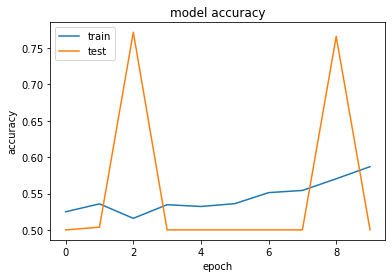

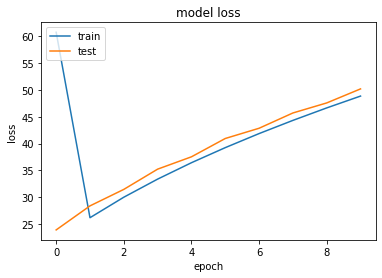

In [110]:
# list all data in history
print(model_cnn_relu.history.history.keys())
# summarize history for accuracy
plt.plot(model_cnn_relu.history.history['accuracy'])
plt.plot(model_cnn_relu.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_cnn_relu.history.history['loss'])
plt.plot(model_cnn_relu.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [174]:
model_cnn_relu_predictions = model_cnn_relu.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_cnn_relu_predictions.argmax(axis=1))
matrix

array([[    2, 11693],
       [    2, 11693]], dtype=int64)

## Model 3: CNN With TanH Activation


In [112]:
# Building the Model
num_classes = 2
model_cnn_tanh = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_tanh.add(Conv2D(32, kernel_size=(4, 4),
                 activation='tanh',
                 input_shape=input_shape,  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(Conv2D(64, (4, 4), activation='tanh',  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_tanh.add(Dropout(0.25))
model_cnn_tanh.add(Flatten())
model_cnn_tanh.add(Dense(50, activation='tanh',  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(Dropout(0.5))
model_cnn_tanh.add(Dense(num_classes, activation='softmax',  kernel_regularizer=regularizers.l2(0.75)))

model_cnn_tanh.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_cnn_tanh.fit(x_train, y_train,
          batch_size=128,
          epochs=5,
          verbose=1,
          validation_data=(x_test, y_test))
score = model_cnn_tanh.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/5
55342/55342 [==============================] - 379s 7ms/step - loss: 3.4686 - accuracy: 0.5110 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 2/5
55342/55342 [==============================] - 387s 7ms/step - loss: 0.6932 - accuracy: 0.4973 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
55342/55342 [==============================] - 387s 7ms/step - loss: 0.6932 - accuracy: 0.4983 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
55342/55342 [==============================] - 398s 7ms/step - loss: 0.6932 - accuracy: 0.4981 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 5/5
55342/55342 [==============================] - 399s 7ms/step - loss: 0.6932 - accuracy: 0.4996 - val_loss: 0.6932 - val_accuracy: 0.5000
Test loss: 0.693186968623598
Test accuracy: 0.5


### Plotting the Loss and Accuracy

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


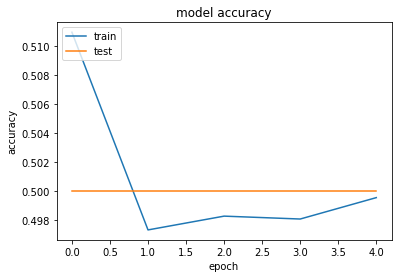

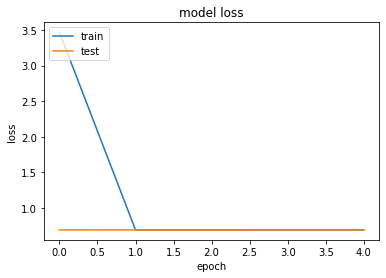

In [113]:
# list all data in history
print(model_cnn_tanh.history.history.keys())
# summarize history for accuracy
plt.plot(model_cnn_tanh.history.history['accuracy'])
plt.plot(model_cnn_tanh.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_cnn_tanh.history.history['loss'])
plt.plot(model_cnn_tanh.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [181]:
model_cnn_tanh_predictions = model_cnn_tanh.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_cnn_tanh_predictions.argmax(axis=1))
matrix

array([[    0, 11695],
       [    0, 11695]], dtype=int64)

## Model 4: Hierarchical Recurrent Neural Networks

As the only neural network that doesn't simply assign one label to all datapoints, this model is the best we've seen so far at classifying cancerous tissue. It does terribly at classifying non-cancerous tissue, but again, if the errors are going to be so imbalanced it's preferable for the model to be more sensitive than specific.


In [178]:
# Training parameters.
batch_size = 64
num_classes = 2
epochs = 5

# Embedding dimensions.
row_hidden = 32
col_hidden = 32


row, col, pixel = x_train.shape[1:]

# 4D input.
x = Input(shape=(row, col, pixel))

# Encodes a row of pixels using TimeDistributed Wrapper.
encoded_rows = TimeDistributed(LSTM(row_hidden))(x)

# Encodes columns of encoded rows.
encoded_columns = LSTM(col_hidden)(encoded_rows)

# Final predictions and model.
prediction = Dense(num_classes, activation='softmax')(encoded_columns)
model_hrnn = Model(x, prediction)
model_hrnn.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# Training.
model_hrnn.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

# Evaluation.
scores = model_hrnn.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/5
55342/55342 [==============================] - 598s 11ms/step - loss: 0.6367 - accuracy: 0.6322 - val_loss: 0.5954 - val_accuracy: 0.7499
Epoch 2/5
55342/55342 [==============================] - 598s 11ms/step - loss: 0.6235 - accuracy: 0.6399 - val_loss: 0.5790 - val_accuracy: 0.7560
Epoch 3/5
55342/55342 [==============================] - 589s 11ms/step - loss: 0.6197 - accuracy: 0.6496 - val_loss: 0.5725 - val_accuracy: 0.7422
Epoch 4/5
55342/55342 [==============================] - 561s 10ms/step - loss: 0.6140 - accuracy: 0.6610 - val_loss: 0.6001 - val_accuracy: 0.7167
Epoch 5/5
55342/55342 [==============================] - 563s 10ms/step - loss: 0.6070 - accuracy: 0.6749 - val_loss: 0.6930 - val_accuracy: 0.6176
Test loss: 0.6930493608047026
Test accuracy: 0.6176143884658813


### Plotting Accuracy and Loss

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


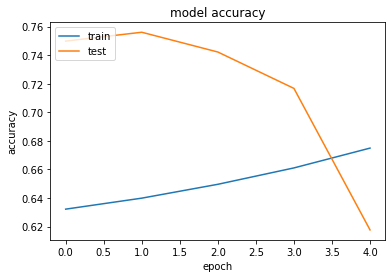

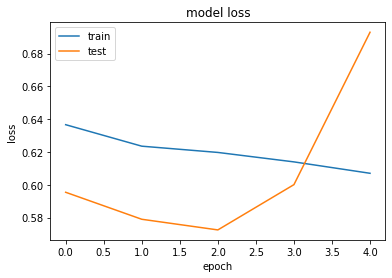

In [179]:
# list all data in history
print(model_hrnn.history.history.keys())
# summarize history for accuracy
plt.plot(model_hrnn.history.history['accuracy'])
plt.plot(model_hrnn.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_hrnn.history.history['loss'])
plt.plot(model_hrnn.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [180]:
model_hrnn_predictions = model_hrnn.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_hrnn_predictions.argmax(axis=1))
matrix

array([[6041, 5654],
       [3290, 8405]], dtype=int64)

|| Non-Cancer Predicted | Cancer Predicted |
|------|------|------|
Non-Cancer | 6,041 | 5,654 |       
Cancer | 3,290 | 8,405 |   

|| Non-Cancer Predicted | Cancer Predicted |
|------|------|------|
Non-Cancer | 51.7% (True Negative)| 48.3% (False Positive) |
Cancer | 28.1% (False Negative) | 71.9% (True Positive)|

# Data Augmentation

So far, all of our models have been overfitting - some of the models haven't learned anything and simply assign one label to every image, and the others aren't able to perform nearly as poorly. Data augmentation will allow me to slightly modify the images in a last-ditch effort to train a model that can classify images and diagnose breast cancer.

In [18]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rotation_range=45,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   validation_split = .2)
test_datagen = ImageDataGenerator(rescale=1./255,
                                  validation_split = .2)

In [116]:
training_set = train_datagen.flow_from_directory('C:\\Users\\M246047\\Documents\\Python\\breast_tissue_train',
                                       target_size=(50, 50),
                                                batch_size=32,
                                     class_mode='categorical',
                                            subset='training',
                                            color_mode='grayscale')

validation_set = test_datagen.flow_from_directory('C:\\Users\\M246047\\Documents\\Python\\breast_tissue_test',
                                        target_size=(50, 50),
                                                 batch_size=32,
                                      class_mode='categorical',
                                               shuffle = False,
                                           subset='validation',
                                             color_mode='grayscale')

Found 86287 images belonging to 2 classes.
Found 16902 images belonging to 2 classes.


### Models 6: CNN with TanH Activation

This is the first Convolutional Neural Network to assign two different classes. It's pretty decent at correctly classifying images with cancerous tissue with a success rate of just over 80%, and labels non-cancerous tissue correctly just below 74% of the time. I spent quite a bit of time tuning this model using different batch sizes, dropout rates, kernel sizes, optimizers, and learning rates, and below is the best model using TanH as activation that was produced.

While I used 30 epochs the last time I ran it, you can see that this is unecessary - the model performs best fairly early in the process. It starts out reasonably high with a validation accuracy just under 70% and increases to near 80% at it's prime around 20 epochs. 

In [117]:
# Building the Model
num_classes = 2
model_6 = Sequential()
# First convolutional layer, note the specification of shape
model_6.add(Conv2D(32, kernel_size=(3, 3),
                 activation='tanh',
                 input_shape=input_shape))
model_6.add(Conv2D(64, (4, 4), activation='tanh'))
model_6.add(MaxPooling2D(pool_size=(2, 2)))
# model_6.add(Dropout(0.5))
model_6.add(Flatten())
# model_6.add(Dense(50, activation='relu'))
model_6.add(Dropout(0.5))
model_6.add(Dense(num_classes, activation='softmax'))

model_6.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(learning_rate=0.01),
              metrics=['accuracy'])

model_6.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=30,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_6.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])



Epoch 1/30
2697/2697 [==============================] - 707s 262ms/step - loss: 0.5092 - accuracy: 0.7533 - val_loss: 1.1594 - val_accuracy: 0.7008
Epoch 2/30
2697/2697 [==============================] - 762s 282ms/step - loss: 0.4796 - accuracy: 0.7719 - val_loss: 1.1119 - val_accuracy: 0.7191
Epoch 3/30
2697/2697 [==============================] - 846s 314ms/step - loss: 0.4762 - accuracy: 0.7726 - val_loss: 1.1020 - val_accuracy: 0.7249
Epoch 4/30
2697/2697 [==============================] - 843s 313ms/step - loss: 0.4743 - accuracy: 0.7739 - val_loss: 1.0779 - val_accuracy: 0.7372
Epoch 5/30
2697/2697 [==============================] - 637s 236ms/step - loss: 0.4732 - accuracy: 0.7732 - val_loss: 1.0811 - val_accuracy: 0.7374
Epoch 6/30
2697/2697 [==============================] - 716s 265ms/step - loss: 0.4723 - accuracy: 0.7744 - val_loss: 1.2381 - val_accuracy: 0.7137
Epoch 7/30
2697/2697 [==============================] - 821s 305ms/step - loss: 0.4712 - accuracy: 0.7743 - val_

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


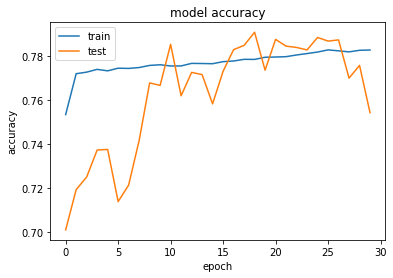

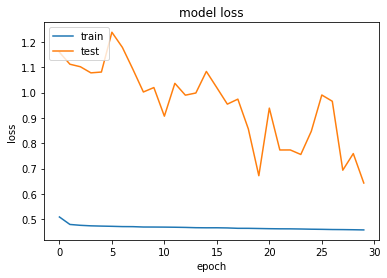

In [118]:
# list all data in history
print(model_6.history.history.keys())
# summarize history for accuracy
plt.plot(model_6.history.history['accuracy'])
plt.plot(model_6.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_6.history.history['loss'])
plt.plot(model_6.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [127]:
model_6_predictions = model_6.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1),model_6_predictions .argmax(axis=1))
matrix

array([[8627, 3068],
       [2257, 9438]], dtype=int64)

|| Non-Cancer Predicted | Cancer Predicted |
|------|------|------|
Non-Cancer | 8,627 | 3,068 |       
Cancer | 2,257 | 9,438 |   

|| Non-Cancer Predicted | Cancer Predicted |
|------|------|------|
Non-Cancer | 73.7% (True Negative)| 26.3% (False Positive) |
Cancer | 19.3% (False Negative) | 80.7% (True Positive)|



### Model 7: CNN with Relu Activation

The most significant difference between models 6 and 7 is the activation - the previous model used TanH where this model uses Relu. The parameters remain mostly unchanged and it performs slightly better, by two percentage points. While this may seem inconsequential, the reality is that any improvement is critical as it leads to fewer incorrect diagnoses. The gain in information comes mostly with an improvement of classifying non-cancerous tissue. The errors in this model are more balanced than those of the CNN model using TanH in that a false positive (incorrectly diagnosing someone with cancer) is much just as likely as a false negative (missing cancerous tissue in a patient). After much tampering and running this model many times, the parameters below provide the best solutions.

In [24]:
# Building the Model
num_classes = 2
model_7 = Sequential()
# First convolutional layer, note the specification of shape
model_7.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))

model_7.add(Conv2D(64, (4, 4), activation='relu'))
model_7.add(MaxPooling2D(pool_size=(2, 2)))

model_7.add(Flatten())
model_7.add(Dense(128, activation='relu'))

model_7.add(Dense(num_classes, activation='softmax'))

model_7.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_7.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=25,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_7.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Epoch 1/25
2697/2697 [==============================] - 893s 331ms/step - loss: 0.4902 - accuracy: 0.7719 - val_loss: 1.2873 - val_accuracy: 0.6892
Epoch 2/25
2697/2697 [==============================] - 889s 330ms/step - loss: 0.4666 - accuracy: 0.7857 - val_loss: 1.0653 - val_accuracy: 0.7442
Epoch 3/25
2697/2697 [==============================] - 842s 312ms/step - loss: 0.4484 - accuracy: 0.7978 - val_loss: 0.9687 - val_accuracy: 0.7943
Epoch 4/25
2697/2697 [==============================] - 1067s 396ms/step - loss: 0.4385 - accuracy: 0.8048 - val_loss: 1.2433 - val_accuracy: 0.8101
Epoch 5/25
2697/2697 [==============================] - 1046s 388ms/step - loss: 0.4296 - accuracy: 0.8108 - val_loss: 1.5466 - val_accuracy: 0.8068
Epoch 6/25
2697/2697 [==============================] - 793s 294ms/step - loss: 0.4224 - accuracy: 0.8155 - val_loss: 1.4006 - val_accuracy: 0.8064
Epoch 7/25
2697/2697 [==============================] - 787s 292ms/step - loss: 0.4189 - accuracy: 0.8159 - va

In [94]:
# Evaluation.
scores = model_7.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Test loss: 0.48022514636850905
Test accuracy: 0.7762719392776489


dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


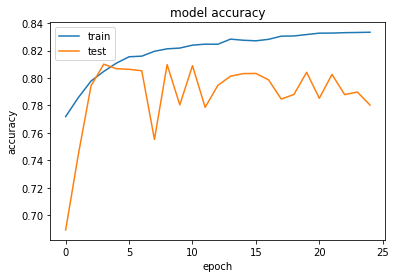

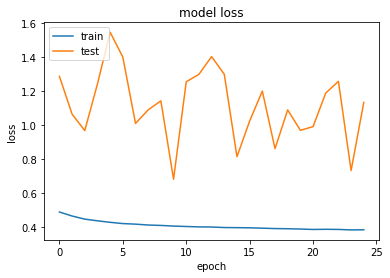

In [28]:
# list all data in history
print(model_7.history.history.keys())
# summarize history for accuracy
plt.plot(model_7.history.history['accuracy'])
plt.plot(model_7.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_7.history.history['loss'])
plt.plot(model_7.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [29]:
model_7_predictions = model_7.predict(x_test)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_7_predictions.argmax(axis=1))
matrix

array([[9242, 2453],
       [2382, 9313]], dtype=int64)

|| Non-Cancerous Predicted | Cancerous Predicted   
|------|------|------|
Actual Class 1| 9,242 | 2,453 |      11,695 
Actual Class 2 | 2,382 | 9,313 |   

|| Non-Cancerous Predicted | Cancerous Predicted   
|------|------|------|
Actual Class 1| 79.1% (True Negative)| 20.9% (False Positive) |
Actual Class 2 | 20.3% (False Negative) | 79.6% (True Positive)|




# Model 8: CNN with Relu & Callbacks

I used callbacks with this model when modifying the parameters. It was very helpful in running the models only until they peaked, saving me time and computer power.

In [166]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Building the Model
num_classes = 2
model_8 = Sequential()
# First convolutional layer, note the specification of shape
model_8.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_8.add(Conv2D(64, (4, 4), activation='relu'))
model_8.add(MaxPooling2D(pool_size=(2, 2)))

model_8.add(Flatten())
model_8.add(Dense(128, activation='relu'))

model_8.add(Dense(num_classes, activation='softmax'))

model_8.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(learning_rate=0.001),
              metrics=['accuracy'])

# Set callback functions to early stop training and save the best model so far
callbacks = [EarlyStopping(monitor='val_accuracy', patience=4),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_accuracy', save_best_only=True)]


history_8 = model_8.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=50,
                    callbacks=callbacks,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_8.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Epoch 1/50
2697/2697 [==============================] - 1013s 376ms/step - loss: 0.5386 - accuracy: 0.7433 - val_loss: 1.4267 - val_accuracy: 0.6660
Epoch 2/50
2697/2697 [==============================] - 851s 316ms/step - loss: 0.5278 - accuracy: 0.7433 - val_loss: 1.3853 - val_accuracy: 0.6660
Epoch 3/50
2697/2697 [==============================] - 871s 323ms/step - loss: 0.5171 - accuracy: 0.7432 - val_loss: 1.2584 - val_accuracy: 0.6672
Epoch 4/50
2697/2697 [==============================] - 831s 308ms/step - loss: 0.5069 - accuracy: 0.7447 - val_loss: 1.2044 - val_accuracy: 0.6740
Epoch 5/50
2697/2697 [==============================] - 957s 355ms/step - loss: 0.4981 - accuracy: 0.7514 - val_loss: 1.1948 - val_accuracy: 0.6839
Epoch 6/50
2697/2697 [==============================] - 1011s 375ms/step - loss: 0.4912 - accuracy: 0.7608 - val_loss: 1.1270 - val_accuracy: 0.6957
Epoch 7/50
2697/2697 [==============================] - 997s 370ms/step - loss: 0.4864 - accuracy: 0.7670 - va

# Conclusions

Below are the evaluation metrics, specificity and sensitivity, for the models used. It's clear that the models with data augmentation performed best, and I'd like to continue testing more models using this technique.

| Model | Specificity (True Negative) | Sensitivity (True Positive) |
|------|------|------|
K-Nearest Neighbor | 62.7% | 44.8% |
XGBoost | 55.9% | 66.0% |
CNN with Relu | 100% | 0% |
CNN with TanH | 100% | 0% |
Hierarchical Recurrent Neural Network | 51.7% | 71.9% |
CNN with Relu & Data Augmentation | 79.6% | 79.1% |
CNN with TanH & Data Augmentation | 73.7% | 80.7% |



# The Product

With the time and resources allocated to me, I was able to create a decent model. I chose this model simply because it had the best test accuracy which is the most important aspect in a model for medical diagnoses. Using data augmentation greatly improved performance, shifting me from a model that assigned all datapoints the same label to a model that actually read the images and classified them based on the features it was able to discern. 

As I move forward with this project, as always, I would like to obtain more data. Having more knowledge of the patients, such as age, weight, biometrics, etc. would be really interesting to add to the data. In addition, I'd like to look at slides of tissue from breasts with no traces of cancer to see how those compare. Are there any signs in non-cancerous tissue of positively diagnosed breasts that could indicate the likelihood of an individual to become cancerous? Is non-cancerous tissue from a cancerous organ different from tissue from a non-cancerous organ? Can we possibly use these images to predict the growth rate of a tumor or spread of cancer? These are questions that I'd love to use this data to answer.

Having the ability to have a machine read and diagnose medical scans accurately and instantaneously has massive implications for the medical field. Allowing doctors and experts to spend more time with patients, on treatment, and expanding their knowledge on their specialty is much more productive and would lead to further discoveries in medicine more quickly. In addition, avoiding human errors on diagnoses would lead to more appropriate treatment options and a lower rate of loss of life. 

As previously mentioned, I'd need more data to maintain my model. Ideally, it would be built into the MRI machine used to take the scans and provide a diagnosis swiftly. With more knowledge, tuning, and data, it may even be able to suggest the best treatment option on an individual basis. The possibilities for a model like this one are endless, and I'm excited to keep exploring it!
